## VERSIÓN 2 DATATHON

In [1]:
import numpy as np
import geopandas as gpd
import pandas as pd
import shapefile as shp
import matplotlib.pyplot as plt
import seaborn as sns
import branca

from shapely.geometry import Point
import folium
from folium.plugins import HeatMap,MarkerCluster
from geopy.distance import great_circle
from geopy.distance import geodesic
from IPython.display import IFrame

## READ DATABASES

In [2]:

poligons=pd.read_csv("D:/Data Science/DS4A/Dataset/geographic.csv")
demographics=pd.read_csv("D:/Data Science/DS4A/Dataset/demographics.csv")
demographics.rename(columns={"nta_code":"ntacode"},inplace=True)
yellow_taxi=pd.read_csv("D:/Data Science/DS4A/Dataset/yellow_trips.csv")
green_taxi=pd.read_csv("D:/Data Science/DS4A/Dataset/green_trips.csv")

KeyboardInterrupt: 

## BANK HOLIDAY'S

In [ ]:
holidays=pd.read_csv("D:/Data Science/DS4A/Dataset/US Bank holidays.csv",names=['index','date','desc'],header=None)
holidays.head()



## Read Shapefiles for Spatial Analaysis

In [3]:
shp_path = "D:/Data Science/DS4A/shapefiles_nti/geo_export_508e88cd-0cd2-4f98-a96b-87e9d91a1846.shp"
#/home/statscol/DS4A/Dataset
#shp_path = "/home/statscol/DS4A/shapefiles_nti/geo_export_508e88cd-0cd2-4f98-a96b-87e9d91a1846.shp"
sh_2=gpd.read_file(shp_path)

In [5]:
geom_taxi_green=[Point(xy) for xy in zip(green_taxi['pickup_longitude'].astype(float).values,green_taxi['pickup_latitude'].astype(float).values)]                                                                             
green_taxi_geo=gpd.GeoDataFrame(green_taxi,geometry=geom_taxi_green)

geom_taxi_yellow=[Point(xy) for xy in zip(yellow_taxi['pickup_longitude'].astype(float).values,yellow_taxi['pickup_latitude'].astype(float).values)]                                                                             
yellow_taxi_geo=gpd.GeoDataFrame(yellow_taxi,geometry=geom_taxi_yellow)

NameError: name 'green_taxi' is not defined

In [50]:
green_taxi_geo=gpd.sjoin(green_taxi_geo, sh_2, how="left", op="within")

C:\Users\jhonp\Anaconda3\lib\site-packages\geopandas\tools\sjoin.py:44: UserWarning: CRS of frames being joined does not match!
  warn('CRS of frames being joined does not match!')


In [55]:


yellow_taxi_geo=gpd.sjoin(yellow_taxi_geo, sh_2, how="left", op="within")


C:\Users\jhonp\Anaconda3\lib\site-packages\geopandas\tools\sjoin.py:44: UserWarning: CRS of frames being joined does not match!
  warn('CRS of frames being joined does not match!')


In [56]:
yellow_taxi_geo['date_new']=yellow_taxi_geo['pickup_datetime'].apply(lambda row: row[0:10])
green_taxi_geo['date_new']=green_taxi_geo['pickup_datetime'].apply(lambda row: row[0:10])

In [57]:
yellow_taxi2=yellow_taxi_geo.merge(holidays[['date','desc']], left_on='date_new', right_on='date',how='left')
green_taxi2=green_taxi_geo.merge(holidays[['date','desc']], left_on='date_new', right_on='date',how='left')


In [58]:
yellow_taxi2.head()

,pickup_datetime,dropoff_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,trip_distance,total_amount,date_new,...,index_right,boro_code,boro_name,county_fip,ntacode,ntaname,shape_area,shape_leng,date,desc
0,2014-04-03 18:28:10,2014-04-03 18:54:32,-74.006033,40.706284,-73.918837,40.744946,1,8.70,34.8,2014-04-03,...,86.0,1.0,Manhattan,061,MN25,Battery Park City-Lower Manhattan,1.901430e+07,43738.499000,NaN,NaN
1,2014-04-16 15:42:00,2014-04-16 16:07:00,-73.979558,40.749357,0.000000,0.000000,1,9.37,30.0,2014-04-16,...,171.0,1.0,Manhattan,061,MN20,Murray Hill-Kips Bay,1.448587e+07,24491.310225,NaN,NaN
2,2014-04-13 18:04:00,2014-04-13 18:07:00,-73.956453,40.775307,-73.954792,40.784992,1,0.89,6.5,2014-04-13,...,119.0,1.0,Manhattan,061,MN32,Yorkville,1.360206e+07,17998.720632,NaN,NaN
3,2014-05-21 19:33:00,2014-05-21 19:45:00,-73.987212,40.757850,-73.960198,40.775472,1,2.40,12.5,2014-05-21,...,89.0,1.0,Manhattan,061,MN17,Midtown-Midtown South,3.019153e+07,27032.700054,NaN,NaN
4,2014-05-30 16:28:00,2014-05-30 16:51:00,-73.974292,40.755397,-74.011867,40.704222,3,5.58,24.5,2014-05-30,...,180.0,1.0,Manhattan,061,MN19,Turtle Bay-East Midtown,1.738916e+07,21124.053584,NaN,NaN


In [59]:
yellow_taxi2['wday']=pd.to_datetime(yellow_taxi2['date_new']).dt.day_name()


In [60]:
green_taxi2['wday']=pd.to_datetime(green_taxi2['date_new']).dt.day_name()
#green_taxi2.to_csv("D:/Data Science/DS4A/Dataset/green_processed.csv",header=True)

In [61]:
#green_taxi2.apply(lambda row: 1 if row['wday']=="Sunday" else,axis=1)
green_taxi2['holiday']=np.logical_or(green_taxi2['date'].notnull() , green_taxi2['wday']=="Sunday")
yellow_taxi2['holiday']=np.logical_or(yellow_taxi2['date'].notnull() , yellow_taxi2['wday']=="Sunday")

In [62]:
yellow_taxi2.to_csv("D:/Data Science/DS4A/Dataset/yellow_processed.csv",header=True)
green_taxi2.to_csv("D:/Data Science/DS4A/Dataset/green_processed.csv",header=True)

In [4]:
## CHECKPOINT, IF NEEDED LOAD DATA AND GO ON
#
green_taxi2=pd.read_csv("D:/Data Science/DS4A/Dataset/green_processed.csv",parse_dates=['date_new'])
#yellow_taxi2=pd.read_csv("D:/Data Science/DS4A/Dataset/yellow_processed.csv",parse_dates=['date_new'])
#green_taxi2=pd.read_csv("/home/statscol/DS4A/Dataset/green_processed.csv",parse_dates=['date_new'])
#green_taxi2=green_taxi2.sample(frac=0.4)
green_taxi2=green_taxi2[green_taxi2['trip_distance']<=100]


In [5]:
yellow_taxi2=pd.read_csv("D:/Data Science/DS4A/Dataset/yellow_processed.csv",parse_dates=['date_new'])
#yellow_taxi2=pd.read_csv("/home/statscol/DS4A/Dataset/yellow_processed.csv",parse_dates=['date_new'])
#yellow_taxi2=yellow_taxi2.sample(frac=0.4)
yellow_taxi2=yellow_taxi2[yellow_taxi2['trip_distance']<=100]  ##REMOVE OUTLIERS
yellow_taxi2.head()

,Unnamed: 0,pickup_datetime,dropoff_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,trip_distance,total_amount,...,boro_name,county_fip,ntacode,ntaname,shape_area,shape_leng,date,desc,wday,holiday
0,0,2014-04-03 18:28:10,2014-04-03 18:54:32,-74.006033,40.706284,-73.918837,40.744946,1,8.70,34.8,...,Manhattan,61.0,MN25,Battery Park City-Lower Manhattan,1.901430e+07,43738.499000,NaN,NaN,Thursday,False
1,1,2014-04-16 15:42:00,2014-04-16 16:07:00,-73.979558,40.749357,0.000000,0.000000,1,9.37,30.0,...,Manhattan,61.0,MN20,Murray Hill-Kips Bay,1.448587e+07,24491.310225,NaN,NaN,Wednesday,False
2,2,2014-04-13 18:04:00,2014-04-13 18:07:00,-73.956453,40.775307,-73.954792,40.784992,1,0.89,6.5,...,Manhattan,61.0,MN32,Yorkville,1.360206e+07,17998.720632,NaN,NaN,Sunday,True
3,3,2014-05-21 19:33:00,2014-05-21 19:45:00,-73.987212,40.757850,-73.960198,40.775472,1,2.40,12.5,...,Manhattan,61.0,MN17,Midtown-Midtown South,3.019153e+07,27032.700054,NaN,NaN,Wednesday,False
4,4,2014-05-30 16:28:00,2014-05-30 16:51:00,-73.974292,40.755397,-74.011867,40.704222,3,5.58,24.5,...,Manhattan,61.0,MN19,Turtle Bay-East Midtown,1.738916e+07,21124.053584,NaN,NaN,Friday,False


### ¿What occus when it's a bank holiday?

    ** Are the trips longer?:
        ** What happens in specific zones of NYC?
        ** How do peak hours behave?

In [39]:
print(green_taxi2.shape)
print(yellow_taxi2.shape)

(3589030, 24)
(7973996, 24)


## We found that people who use taxi on holidays: bank holidays and sunday's, travel longer distances compared to normal workdays.

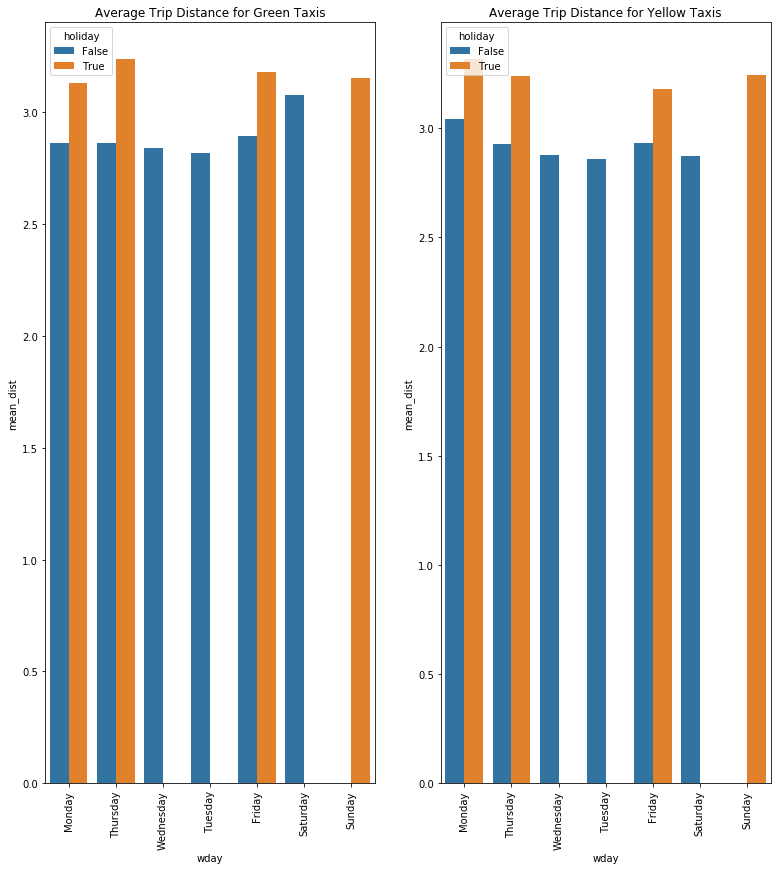

In [8]:
comp_holiday=green_taxi2.groupby(['wday','holiday'])['trip_distance'].mean().reset_index(name="mean_dist")
comp_holiday_yellow=yellow_taxi2.groupby(['wday','holiday'])['trip_distance'].mean().reset_index(name="mean_dist")

f,ax=plt.subplots(1,2,figsize=(13,14))
sns.barplot(ax=ax[0],x="wday",y="mean_dist",hue="holiday",data=comp_holiday,order=['Monday','Thursday',"Wednesday",'Tuesday','Friday','Saturday','Sunday'])
ax[0].set_title('Average Trip Distance for Green Taxis');
ax[0].set_xticklabels(ax[0].get_xticklabels(),rotation=90);

sns.barplot(ax=ax[1],x="wday",y="mean_dist",hue="holiday",data=comp_holiday_yellow,order=['Monday','Thursday',"Wednesday",'Tuesday','Friday','Saturday','Sunday'])
ax[1].set_title('Average Trip Distance for Yellow Taxis');
ax[1].set_xticklabels(ax[1].get_xticklabels(),rotation=90);


### Insights:

    ** Yellow Taxi's distances on every trip are greater than green taxi's on average **
    ** Green Taxi's distances do not differ on holidays
    

In [11]:
### GET MEAN DISTANCE FOR NTA WHETHER IS HOLIDAY OR NOT

green_taxi_holiday=green_taxi2[green_taxi2['holiday']==1].groupby(['ntacode'])['trip_distance'].mean().reset_index(name="mean_dist")
green_taxi_normal=green_taxi2[green_taxi2['holiday']==0].groupby(['ntacode'])['trip_distance'].mean().reset_index(name="mean_dist")

yellow_taxi_holiday=yellow_taxi2[yellow_taxi2['holiday']==1].groupby(['ntacode'])['trip_distance'].mean().reset_index(name="mean_dist")
yellow_taxi_normal=yellow_taxi2[yellow_taxi2['holiday']==0].groupby(['ntacode'])['trip_distance'].mean().reset_index(name="mean_dist")


## IT SEEMS THERE IS AN OVERALL DIFFERENCE IN MEAN OR MEDIAN DISTANCE FOR TAXI TRIPS

###  USING T-TESTS FOR MEAN  AND KRUSKAL WALLIS TEST FOR MEDIANS, IT'S POSSIBLE TO THINK THAT DISTANCES TRAVELED BY NYC CITIZENS ON HOLIDAYS, DIFFER RESPECT TO WORKDAYS (P-values lower than $\alpha$ =0.05 )

In [10]:
from scipy.stats import ttest_ind,kruskal

#LETS COMPARE MEANS AND MEDIANS FOR TRIP_DISTANCE
_,pval_green=ttest_ind(green_taxi2[green_taxi2['holiday']==1]['trip_distance'].values,green_taxi2[green_taxi2['holiday']==0]['trip_distance'].values,equal_var = False)
print(f"Pval T-test Green Taxi: {pval_green}")
_,pval_yellow=ttest_ind(yellow_taxi2[yellow_taxi2['holiday']==1]['trip_distance'].values,yellow_taxi2[yellow_taxi2['holiday']==0]['trip_distance'].values,equal_var = False)
print(f"Pval t-test yellow Taxi: {pval_yellow}")


_,pval_green=kruskal(green_taxi2[green_taxi2['holiday']==1]['trip_distance'].values,green_taxi2[green_taxi2['holiday']==0]['trip_distance'].values,equal_var = False)
print(f"Pval Kruskal Green Taxi: {pval_green}")
_,pval_yellow=kruskal(yellow_taxi2[yellow_taxi2['holiday']==1]['trip_distance'].values,yellow_taxi2[yellow_taxi2['holiday']==0]['trip_distance'].values,equal_var = False)
print(f"Pval Kruskal yellow Taxi: {pval_yellow}")



Pval T-test Green Taxi: 0.0
Pval t-test yellow Taxi: 0.0


C:\Users\jhonp\Anaconda3\lib\site-packages\scipy\stats\stats.py:5090: RuntimeWarning: overflow encountered in long_scalars
  h = 12.0 / (totaln * (totaln + 1)) * ssbn - 3 * (totaln + 1)


Pval Kruskal Green Taxi: 0.0
Pval Kruskal yellow Taxi: 0.0


## What occurs in different day hours?

### It was found that peak distances trips occur at 5 or 6 AM regardless of whether or not it is a holiday. On the other hand, in addition to the statements made before. Its clear that on average people travel longer distances on holidays, no matter what time of the day they request a taxi.

In [12]:
### GET DATETIME HOUR OF THE DAY AND DURATION
green_taxi2['pickup_datetime']=pd.to_datetime(green_taxi2['pickup_datetime'])
green_taxi2['dropoff_datetime']=pd.to_datetime(green_taxi2['dropoff_datetime'])
### CONVERT TRIP LENGTH TO MINUTES
green_taxi2['length_trip']=(green_taxi2['dropoff_datetime']-green_taxi2['pickup_datetime']).astype('timedelta64[s]')/60

yellow_taxi2['pickup_datetime']=pd.to_datetime(yellow_taxi2['pickup_datetime'])
yellow_taxi2['dropoff_datetime']=pd.to_datetime(yellow_taxi2['dropoff_datetime'])
### CONVERT TRIP LENGTH TO MINUTES
yellow_taxi2['length_trip']=(yellow_taxi2['dropoff_datetime']-yellow_taxi2['pickup_datetime']).astype('timedelta64[s]')/60



In [13]:
green_taxi2['hour_pick']=green_taxi2['pickup_datetime'].dt.hour
yellow_taxi2['hour_pick']=yellow_taxi2['pickup_datetime'].dt.hour

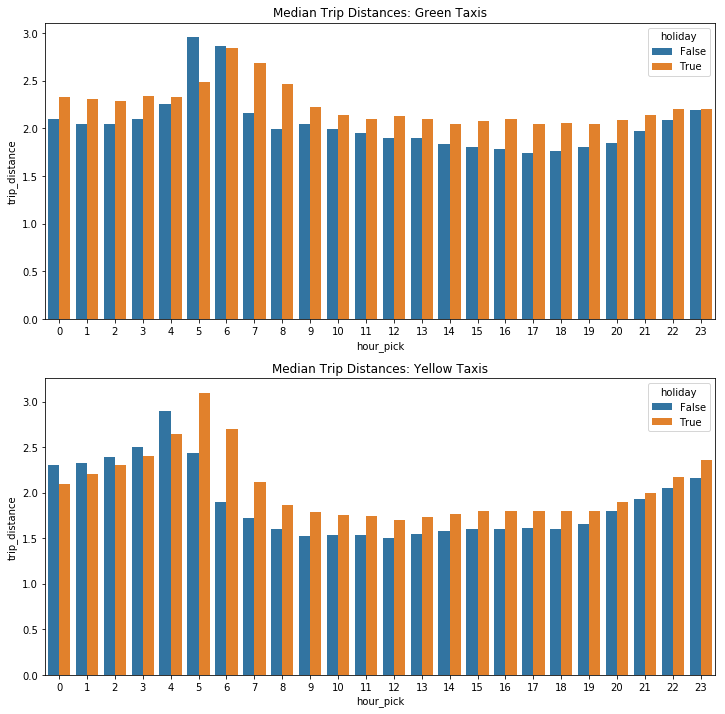

In [18]:
##TRICK TO REDUCE COMPUTATION TIME TO RESUME DATASET AND THEN PLOT IT.
green_group=green_taxi2.groupby(['hour_pick','holiday'],as_index=False)['trip_distance'].median()
yellow_group=yellow_taxi2.groupby(['hour_pick','holiday'],as_index=False)['trip_distance'].median()

f,ax=plt.subplots(2,1,figsize=(12,12))
sns.barplot(ax=ax[0],x="hour_pick",y="trip_distance",hue='holiday',data=green_group)
ax[0].set_title("Median Trip Distances: Green Taxis");
sns.barplot(ax=ax[1],x="hour_pick",y="trip_distance",hue='holiday',data=yellow_group)
ax[1].set_title("Median Trip Distances: Yellow Taxis");

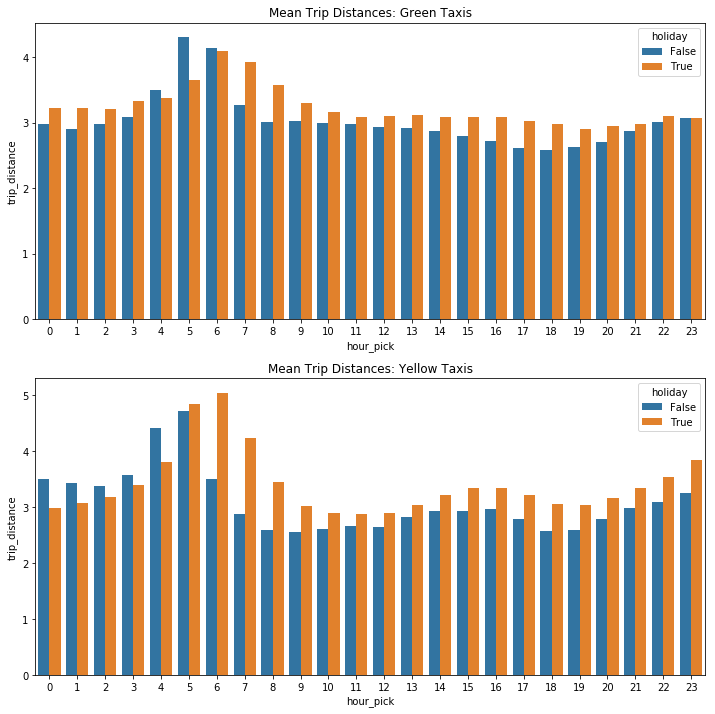

In [16]:
green_group=green_taxi2.groupby(['hour_pick','holiday'],as_index=False)['trip_distance'].mean()
yellow_group=yellow_taxi2.groupby(['hour_pick','holiday'],as_index=False)['trip_distance'].mean()


f,ax=plt.subplots(2,1,figsize=(12,12))
sns.barplot(ax=ax[0],x="hour_pick",y="trip_distance",hue='holiday',data=green_group);
ax[0].set_title("Mean Trip Distances: Green Taxis");
sns.barplot(ax=ax[1],x="hour_pick",y="trip_distance",hue='holiday',data=yellow_group);
ax[1].set_title("Mean Trip Distances: Yellow Taxis");

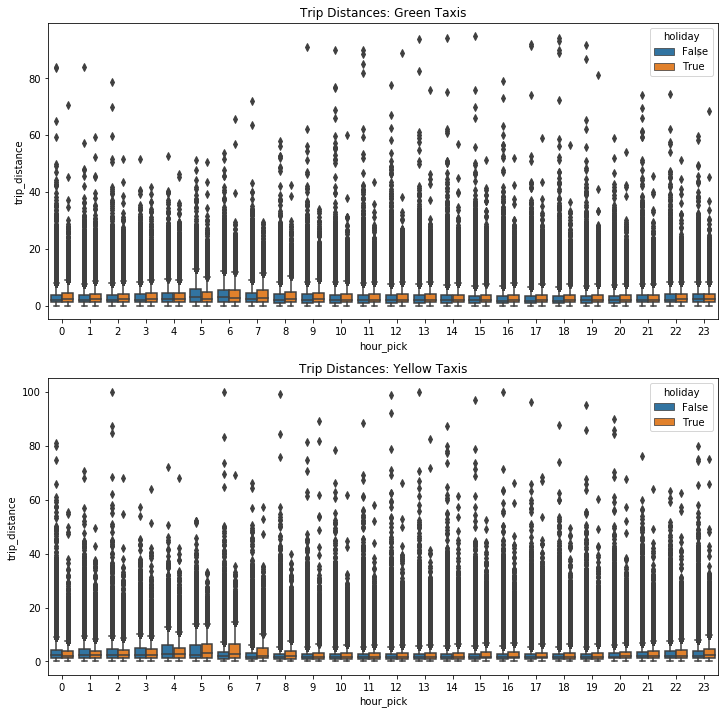

In [15]:
## boxplots to look for variation

f,ax=plt.subplots(2,1,figsize=(12,12))
sns.boxplot(ax=ax[0],x='hour_pick',y="trip_distance",hue="holiday",data=green_taxi2)
ax[0].set_title("Trip Distances: Green Taxis");
sns.boxplot(ax=ax[1],x='hour_pick',y="trip_distance",hue="holiday",data=yellow_taxi2)
ax[1].set_title("Trip Distances: Yellow Taxis");

### Are there any zones where distances are larger on holidays?

In [19]:
ny_trip_distance_green_hol=sh_2.merge(green_taxi_holiday,how="left",on="ntacode")
ny_trip_distance_green_normal=sh_2.merge(green_taxi_normal,how="left",on="ntacode")
ny_trip_distance_yellow_hol=sh_2.merge(yellow_taxi_holiday,how="left",on="ntacode")
ny_trip_distance_yellow_normal=sh_2.merge(yellow_taxi_normal,how="left",on="ntacode")


C:\Users\jhonp\Anaconda3\lib\site-packages\geopandas\plotting.py:385: FutureWarning: 'colormap' is deprecated, please use 'cmap' instead (for consistency with matplotlib)
  "(for consistency with matplotlib)", FutureWarning)
C:\Users\jhonp\Anaconda3\lib\site-packages\matplotlib\colors.py:512: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


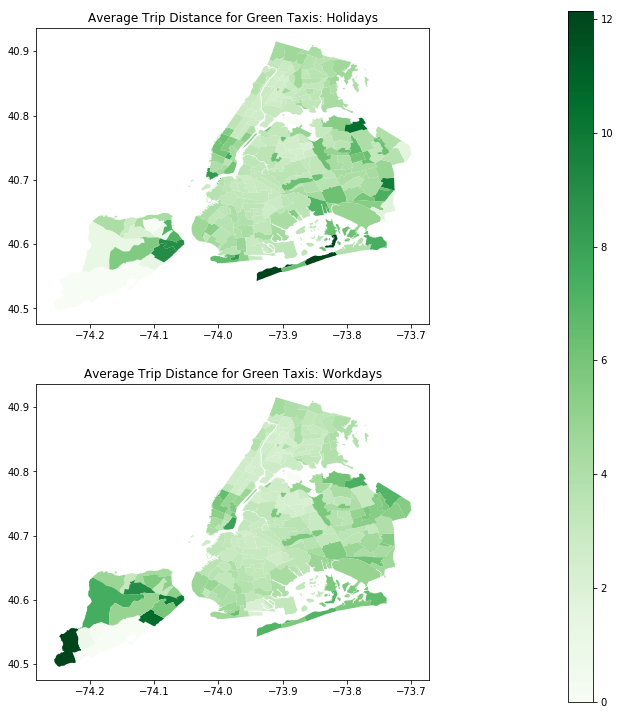

In [20]:
###GREEN TAXIS COMPARISON

vmin=ny_trip_distance_green_hol['mean_dist'].min()
vmax=ny_trip_distance_green_hol['mean_dist'].max()

f,ax=plt.subplots(2,1,figsize=(12,12))
ny_trip_distance_green_hol.plot(ax=ax[0],column='mean_dist', colormap='Greens',vmin=vmin, vmax=vmax)
fig = ax[0].get_figure()
ax[0].set_title('Average Trip Distance for Green Taxis: Holidays');
cax = fig.add_axes([0.9, 0.1, 0.03, 0.8])
sm = plt.cm.ScalarMappable(cmap='Greens', norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
fig.colorbar(sm, cax=cax)

ny_trip_distance_green_normal.plot(ax=ax[1],column='mean_dist', colormap='Greens',vmin=vmin, vmax=vmax)
ax[1].set_title('Average Trip Distance for Green Taxis: Workdays');

#fig1 = ax[1].get_figure()
#cax1 = fig1.add_axes([0.9, 0.1, 0.03, 0.8])
# fake up the array of the scalar mappable. Urgh...
#sm._A = []
#fig.colorbar(sm, cax=cax)

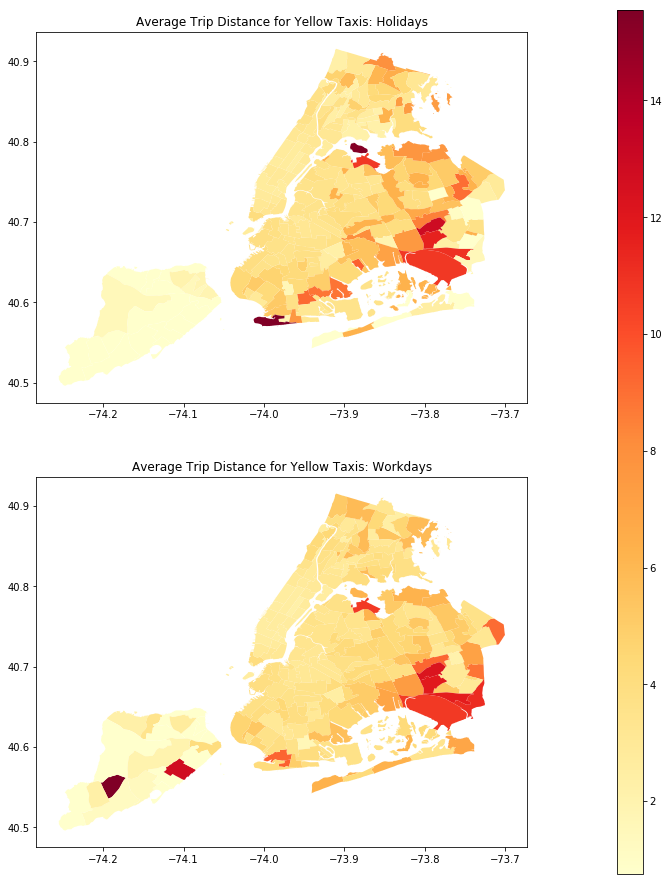

In [16]:
###YELLOW TAXIS COMPARISON

vmin2=ny_trip_distance_yellow_hol['mean_dist'].min()
vmax2=ny_trip_distance_yellow_hol['mean_dist'].max()

f,ax=plt.subplots(2,1,figsize=(12,15))
ny_trip_distance_yellow_hol.plot(ax=ax[0],column='mean_dist', colormap='YlOrRd',vmin=vmin2, vmax=vmax2)
fig = ax[0].get_figure()
ax[0].set_title('Average Trip Distance for Yellow Taxis: Holidays');
cax = fig.add_axes([0.9, 0.1, 0.03, 0.8])
sm = plt.cm.ScalarMappable(cmap='YlOrRd', norm=plt.Normalize(vmin=vmin, vmax=vmax))
# fake up the array of the scalar mappable. Urgh...
sm._A = []
fig.colorbar(sm, cax=cax)

ny_trip_distance_yellow_normal.plot(ax=ax[1],column='mean_dist', colormap='YlOrRd',vmin=vmin2, vmax=vmax2)
ax[1].set_title('Average Trip Distance for Yellow Taxis: Workdays');


## THE ABOVE BUT IN FOLIUM

### PLOTTING CHLOROPLETHS WITH FOLIUM

In [22]:
new_geo=ny_trip_distance_green_hol[['geometry','ntaname',"mean_dist"]].to_json()

In [23]:
world_map = folium.Map(
        location=[40.730610, -73.935242],
        zoom_start=12,
        tiles='openstreetmap'
        )

folium.Choropleth(
    geo_data=new_geo,
    data=ny_trip_distance_green_hol,
    columns=['ntaname','mean_dist'],
    key_on='feature.properties.ntaname',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Mean Distance per Trip on Holidays: Green Taxi'
).add_to(world_map)

world_map
#world_map.save('index.html')

### Define color Schema for all options

In [24]:
from branca.colormap import linear

def get_colormap(df):
    vmin=df['mean_dist'].quantile(0.75)
    vmax=df['mean_dist'].max()
    return(branca.colormap.linear.YlOrRd_09.scale(vmin,vmax))

boro_dict_ghol = ny_trip_distance_green_hol.set_index('ntacode')['mean_dist'].sort_values()
boro_dict_gnorm = ny_trip_distance_green_normal.set_index('ntacode')['mean_dist'].sort_values()
boro_dict_ynorm = ny_trip_distance_yellow_normal.set_index('ntacode')['mean_dist'].sort_values()
boro_dict_yhol = ny_trip_distance_yellow_hol.set_index('ntacode')['mean_dist'].sort_values()


print(boro_dict_ghol['MN06'],boro_dict_gnorm['MN06'])
print(boro_dict_yhol['MN06'],boro_dict_ynorm['MN06'])

2.972222222222227 2.7296250699496407
3.3574689826302726 3.175331184528615


## GREEN TAXIS: HOLIDAYS VS WORKING DAYS




In [2]:
####COLOR FUNCTION
colormap =  get_colormap(ny_trip_distance_green_hol)
colormap.caption="NY trip Distances on Holidays: Green Taxis"

def get_color(feature):
    value = feature['properties']['mean_dist']
    if value is None:
        return '#8c8c8c' # MISSING -> gray
    else:
        return colormap(boro_dict_ghol[feature['properties']['ntacode']])

### MAP DEFINITION

m = folium.Map(location=[40.730610, -73.935242], zoom_start=10,
                        tiles="OpenStreetMap")

folium.GeoJson(
    ny_trip_distance_green_hol[['geometry','ntaname',"mean_dist","ntacode"]].to_json(),
    style_function=lambda feature: {
        'fillColor': get_color(feature),
        'color': 'black',
        'weight':2,
        'fillOpacity':2
        #'dashArray' : '5, 5'
        },
    tooltip=folium.GeoJsonTooltip(
        fields=['ntaname', 'mean_dist'],
        aliases=['District Name', 'Mean Trip Distance'], 
        localize=True
    )
    ).add_to(m)
colormap.add_to(m)
m.save("green_holiday.html")
#m



NameError: name 'get_colormap' is not defined

In [3]:
IFrame(src='./green_holiday.html', width=800, height=400)

#### When it comes to green taxis in holidays, people in Belle Harbor-Rockaway Park  travel the longest distances followed by 

In [31]:
####COLOR FUNCTION
colormap =  get_colormap(ny_trip_distance_green_normal)
colormap.caption="NY trip Distances on Workdays: Green taxis"

def get_color(feature):
    value = feature['properties']['mean_dist']
    if value is None:
        return '#8c8c8c' # MISSING -> gray
    else:
        return colormap(boro_dict_gnorm[feature['properties']['ntacode']])


### MAP DEFINITION

m = folium.Map(location=[40.730610, -73.935242], zoom_start=10,
                        tiles="OpenStreetMap")

folium.GeoJson(
    ny_trip_distance_green_normal[['geometry','ntaname',"mean_dist","ntacode"]].to_json(),
    style_function=lambda feature: {
        'fillColor': get_color(feature),
        'color': 'black',
        'weight':2,
        'fillOpacity':2
        #'dashArray' : '5, 5'
        },
    tooltip=folium.GeoJsonTooltip(
        fields=['ntaname', 'mean_dist'],
        aliases=['District Name', 'Mean Trip Distance'], 
        localize=True
    )
    ).add_to(m)
colormap.add_to(m)
m.save("green_normal.html")
#m


In [4]:
IFrame(src='./green_normal.html', width=700, height=600)

### Working days seem critical for people in Charleston-Richmond since they travel 17.33 miles on average each day. 

## YELLOW TAXIS: HOLIDAYS VS WORKING DAYS

In [26]:
####COLOR FUNCTION
colormap2 =  get_colormap(ny_trip_distance_yellow_hol)
colormap2.caption="NY trip Distances on Holidays: Yellow Taxis"
def get_color(feature):
    value = feature['properties']['mean_dist']
    if value is None:
        return '#8c8c8c' # MISSING -> gray
    else:
        return colormap2(boro_dict_yhol[feature['properties']['ntacode']])

### MAP DEFINITION

m2 = folium.Map(location=[40.730610, -73.935242], zoom_start=10,
                        tiles="OpenStreetMap")
folium.GeoJson(
    ny_trip_distance_yellow_hol[['geometry','ntaname',"mean_dist","ntacode"]].to_json(),
    style_function=lambda feature: {
        'fillColor': get_color(feature),
        'color': 'black',
        'weight':2,
        'fillOpacity':2
        #'dashArray' : '5, 5'
        },
    tooltip=folium.GeoJsonTooltip(
        fields=['ntaname', 'mean_dist'],
        aliases=['District Name', 'Mean Trip Distance'], 
        localize=True
    )
    ).add_to(m2)

colormap2.add_to(m2)

m2.save("yellow_holiday.html","w")




In [5]:
IFrame(src='./yellow_holiday.html', width=800, height=400)

#### People from Grasmere-Arrochar , Far Rockaway and Rickers Island travel longer distances on holidays when using yellow taxis.

In [28]:
####COLOR FUNCTION
colormap =  get_colormap(ny_trip_distance_yellow_normal)
colormap.caption="NY trip Distances on Workdays: Yellow Taxis"

def get_color(feature):
    value = feature['properties']['mean_dist']
    if value is None:
        return '#8c8c8c' # MISSING -> gray
    else:
        return colormap(boro_dict_ynorm[feature['properties']['ntacode']])

### MAP DEFINITION

m2 = folium.Map(location=[40.730610, -73.935242], zoom_start=10,
                        tiles="OpenStreetMap")
folium.GeoJson(
    ny_trip_distance_yellow_normal[['geometry','ntaname',"mean_dist","ntacode"]].to_json(),
    style_function=lambda feature: {
        'fillColor': get_color(feature),
        'color': 'black',
        'weight':2,
        'fillOpacity':2
        #'dashArray' : '5, 5'
        },
    tooltip=folium.GeoJsonTooltip(
        fields=['ntaname', 'mean_dist'],
        aliases=['District Name', 'Mean Trip Distance'], 
        localize=True
    )
    ).add_to(m2)
colormap.add_to(m2)
m2.save("yellow_normal.html")


IFrame(src='./yellow_normal.html', width=800, height=400)

In [6]:
IFrame(src='./yellow_normal.html', width=800, height=400)

#### People from Arden Heights, New dorp-midland beach and Charleston-Richmond who use yellow taxis are the ones that travel the longest distances on working days

